<div style="width: 100%; clear: both;">
<div style="float: left; width: 20%;">
<img src="https://www.uoc.edu/portal/_resources/common/imatges/sala_de_premsa/noticies/2016/202-nova-marca-uoc.jpg_170798054.jpg", align="left">
</div>
<div style="float: right; width: 80%;">
<p style="margin: 0; padding-top: 22px; text-align:right;">M2.855 · Modelos avanzados de minería de datos · PEC2</p>
<p style="margin: 0; text-align:right;">2023-1 · Máster universitario en Ciencia de datos (Data science)</p>
<p style="margin: 0; text-align:right; padding-button: 100px;">Estudios de Informática, Multimedia y Telecomunicación</p>
</div>
</div>
<div style="width:100%;">&nbsp;</div>


# PEC 2: Métodos no supervisados

**Importante: la entrega debe contener el notebook (.ipynb) y su HTML tras la completa ejecución secuencial (.html) donde se pueda ver el código y los resultados. Para exportar el notebook a HTML puedes hacerlo desde el menú File → Download as → HTML.**

A lo largo de esta práctica veremos como aplicar distintas técnicas no supervisadas
así como algunas de sus aplicaciones reales:

 - **[Clustering con distintas estrategias](#ej1)**: k-means y regla del codo, basadas en densidad y jerárquicas.
 - **[Ejemplo práctico con aperturas de ajedrez](#ej2)**: reducción de dimensionalidad, clustering y análisis.

<div class="alert alert-block alert-info">
<strong>Nombre y apellidos:</strong>
</div>

Cristina Vallejos Valdor

---

Para ello vamos a necesitar las siguientes librerías:

In [1]:
import random

import tqdm
import umap
import numpy as np
import pandas as pd
import sklearn
from sklearn import cluster        # Algoritmos de clustering.
from sklearn import datasets       # Crear datasets.
from sklearn import decomposition  # Algoritmos de reduccion de dimensionalidad.

# Visualizacion.
import matplotlib
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.express as px

%matplotlib inline

<a id="ej1"></a>

## 1. Métodos de *clustering* (4 puntos)

Este ejercicio trata de explorar distintas técnicas de agrupamiento ajustándolas a distintos conjuntos de datos.

El objetivo es doble: entender la influencia de los parámetros en su comportamiento, y conocer sus limitaciones en la búsqueda de estructuras de datos.

### Generación de los conjuntos de datos

In [2]:
X_blobs, y_blobs = datasets.make_blobs(n_samples=1000, n_features=2, centers=4, cluster_std=1.6, random_state=42)
X_moons, y_moons = datasets.make_moons(n_samples=1000, noise=.07, random_state=42)
X_circles, y_circles = datasets.make_circles(n_samples=1000, factor=.5, noise=.05, random_state=42)

Cada dataset tiene 2 variables: una variable *X* que contiene 2 features (columnas) y tantas filas como muestras. Y una variable *y* que alberga las etiquetas que identifican cada cluster.

A lo largo del ejercicio no se usará la variable *y* (sólo con el objetivo de visualizar). El objetivo es a través de los distintos modelos de *clustering* conseguir encontrar las estructuras descritas por las variables *y*.

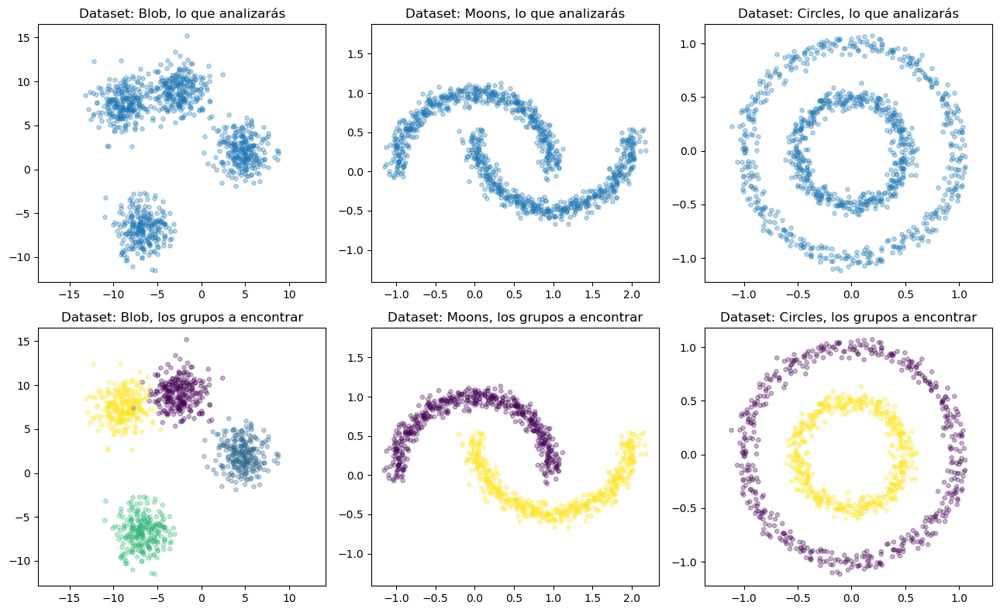

In [3]:
fig, axis = plt.subplots(2, 3, figsize=(13, 8))
for i, (X, y, ax, name) in enumerate(zip([X_blobs, X_moons, X_circles] * 2,
                                         [None] * 3 + [y_blobs, y_moons, y_circles],
                                         axis.reshape(-1),
                                         ['Blob', 'Moons', 'Circles'] * 2)):
    ax.set_title('Dataset: {}, '.format(name) + ('lo que analizarás' if i < 3 else 'los grupos a encontrar'))
    ax.scatter(X[:,0], X[:,1], s=15, c=y, alpha=.3)
    ax.axis('equal')
plt.tight_layout()

### 1 a. K-means

En este apartado se pide probar el algoritmo *k-means* sobre los tres datasets presentados anteriormente ajustando con los parámetros adecuados y analizar sus resultados.

In [4]:
from sklearn.preprocessing import scale
X, y = X_blobs, y_blobs
X_scaled = scale(X)

Para estimar el número de clusters a detectar por *k-means*. Una técnica para estimar $k$ es, como se explica en la teoría:
> Los criterios anteriores (minimización de distancias intra grupo o maximización de distancias inter grupo) pueden usarse para establecer un valor adecuado para el parámetro k. Valores k para los que ya no se consiguen mejoras significativas en la homogeneidad interna de los segmentos o la heterogeneidad entre segmentos distintos, deberían descartarse.

Lo que popularmente se conocer como *regla del codo*.

Primero es necesario calcular la suma de los errores cuadráticos ([*SSE*](https://bl.ocks.org/rpgove/0060ff3b656618e9136b)) que consiste en la suma de todos los errores (distancia de cada punto a su centroide asignado) al cuadrado.

$$SSE = \sum_{i=1}^{K} \sum_{x \in C_i} euclidean(x, c_i)^2$$

Donde $K$ es el número de clusters a buscar por *k-means*, $x \in C_i$ son los puntos que pertenecen a i-ésimo cluster, $c_i$ es el centroide del cluster $C_i$ (al que pertenece el punto $x$), y $euclidean$ es la [distancia euclídea](https://en.wikipedia.org/wiki/Euclidean_distance).

Este procedimiento realizado para cada posible valor $k$, resulta en una función monótona decreciente, donde el eje $x$ representa los distintos valores de $k$, y el eje $y$ el $SSE$. Intuitivamente se podrá observar un significativo descenso del error, que indicará el valor idóneo de $k$.

**Se pide realizar la representación gráfica de la regla del codo junto a su interpretación, utilizando la librería ```matplotlib``` y la implementación en scikit-learn de [*k-means*](http://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html).**

<div class="alert alert-block alert-info">
    <strong>Implementación:</strong> cálculo y visualización de la regla del codo en el dataset Blobs.
</div>

In [5]:
def elbow_method(X):
    """
    Proporciona una visualización que permite identificar cuántos clústeres son apropiados para los datos.
    
    Parámetros:
    -----------
    X : dataset
    """
    inertias = []
    range_n_clusters = range(1,10) 
    for k in range_n_clusters:
        kmeanModel = cluster.KMeans(n_clusters=k, n_init=10, random_state=123)
        kmeanModel.fit(X)
        inertias.append(kmeanModel.inertia_)
    

    plt.figure(figsize=(16,8))
    plt.plot(range_n_clusters, inertias, marker='o')
    plt.title("Elbow method")
    plt.xlabel('Number of cluster')
    plt.ylabel('Intra-cluster')
    plt.show()

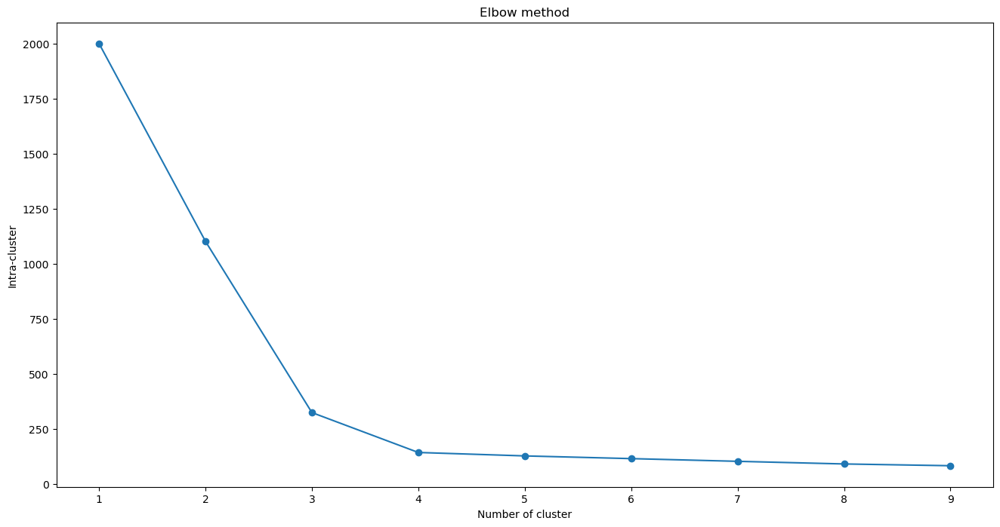

In [6]:
elbow_method(X_scaled)

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> ¿Qué se interpreta en la gráfica? ¿Cómo podría mejorarse la elección de $k$?.  
</div>

Observamos cómo a partir de $k=4$, la mejora que se produce en la distancia interna de los segmentos comienza a ser insignificante. Esto indica que 4 segmentos es un valor adecuado para $k$.

Dado que conocemos el número real de clusters (en este caso, 4), la elección de $k$ basada en la regla del codo es acertada y por lo tanto no hay margen de mejora.

<div class="alert alert-block alert-info">
<strong>Implementación:</strong> cálculo y visualización de los grupos en el dataset Blobs.
</div>

In [7]:
def k_means(X, clusters_number):
    """
    Realiza el ajuste de un modelo K-Means a los datos y compara visualmente cómo
    se agrupan los datos en función de las etiquetas reales (primer subgráfico)
    y cómo se agrupan según las predicciones del modelo K-Means (segundo subgráfico).    
    Parámetros:
    -----------
    X : dataset
    """
    kmeanModel = cluster.KMeans(n_clusters=clusters_number, n_init=10, random_state=123)
    kmeanModel.fit(X)

    fig, axes = plt.subplots(1, 2, figsize=(16,8))
    axes[0].scatter(X[:,0], X[:,1], c=y)
    axes[1].scatter(X[:,0], X[:,1], c=kmeanModel.predict(X), cmap=plt.cm.Set1)
    axes[0].set_title('Actual', fontsize=18)
    axes[1].set_title('K_Means', fontsize=18)

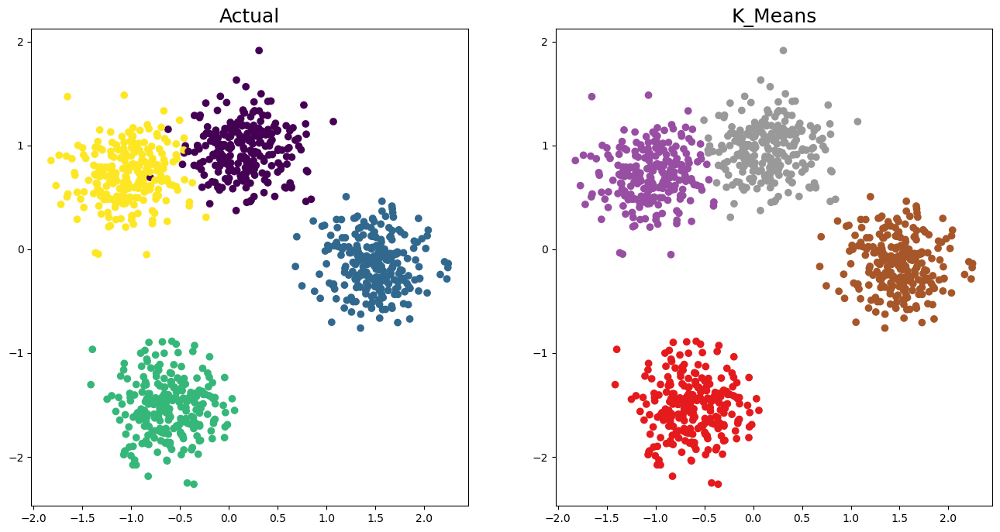

In [8]:
k_means(X_scaled, 4)

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> ¿Qué ha sucedido? Explica los motivos por los que crees que se ha producido ese resultado. 
</div>

En las gráficas anteriores, se puede apreciar que los resultados obtenidos son altamente satisfactorios. Con excepción de algunas asignaciones incorrectas para algunos puntos, en general, el algoritmo K-means ha tenido un desempeño acertado en la identificación de las agrupaciones. Este éxito se debe a que en el conjunto de datos original, los grupos tienen una estructura compacta y convexa. En tales condiciones, K-means es un método particularmente eficaz.

In [9]:
X, y = X_moons, y_moons
X_scaled = scale(X)

<div class="alert alert-block alert-info">
    <strong>Implementación:</strong> cálculo y visualización de la regla del codo en el dataset Moons.
</div>

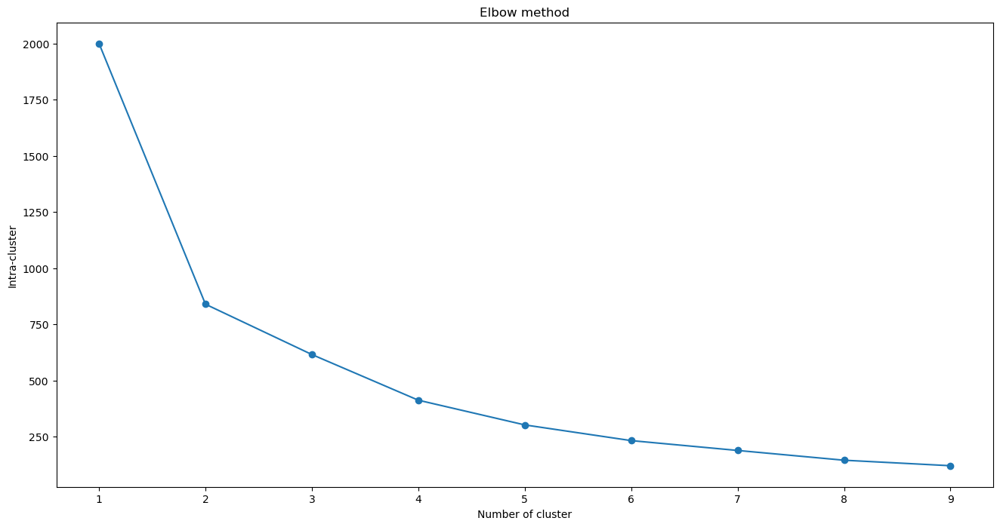

In [10]:
elbow_method(X_scaled)

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> ¿Qué se interpreta en la gráfica? ¿Cómo podría mejorarse la elección de $k$?.  
</div>

La observación del gráfico no permite extraer un valor concluyente de $k$ al aplicar la regla del codo. Una forma de resolver este *handicap* es por medio de la utilización de otros métodos para constrastar el resultado, como por ejemplo, el método de la silueta o el método del Gap Statistics.

Utilicemos el método de la silueta:

In [11]:
from sklearn.metrics import silhouette_score


def silhouette_plot(X):
    """
    Ayudar a determinar el número óptimo de clusters en un algoritmo de clustering K-means
    al observar cómo cambia el valor de la silueta con diferentes valores de k.
    -----------
    X : dataset
    """

    silhouette_mean_values = []

    range_n_clusters = range(2,10) 

    for k in range_n_clusters:
        kmeans = cluster.KMeans(n_clusters=k,  n_init = 10, random_state = 123)
        cluster_labels = kmeans.fit_predict(X)
        silhouette_avg = silhouette_score(X, cluster_labels)
        silhouette_mean_values.append(silhouette_avg)
    
    fig, ax = plt.subplots(1, 1, figsize=(6, 3.84))
    ax.plot(range_n_clusters, silhouette_mean_values, marker='o')
    ax.set_title("Silhouette method")
    ax.set_xlabel('Number of clusters')
    ax.set_ylabel('Silhouette mean indexes');

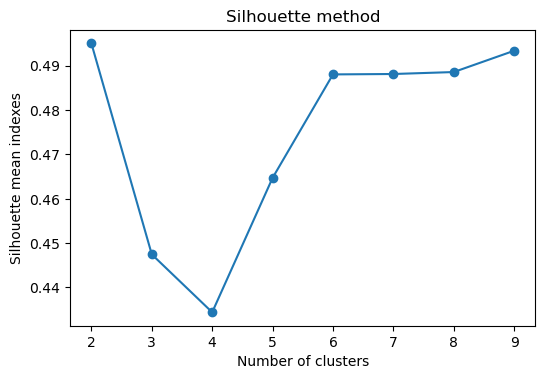

In [12]:
silhouette_plot(X_scaled)

Observamos en el gráfico anterior, que el valor de la silueta se maximiza para $k=2$, lo que nos indica que podríamos aplicar el algoritmo considerando dos clusters:

<div class="alert alert-block alert-info">
<strong>Implementación:</strong> cálculo y visualización de los grupos en el dataset Moons.
</div>

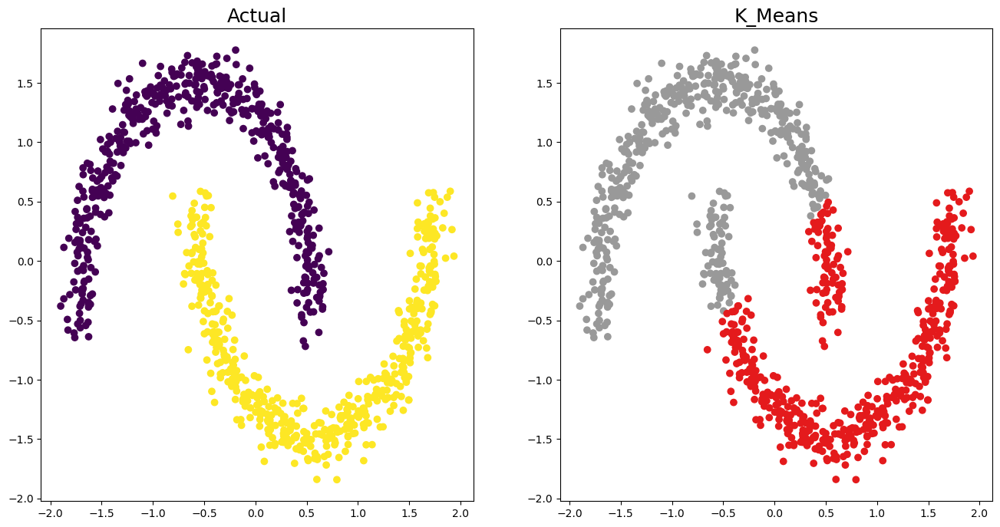

In [13]:
k_means(X_scaled, 2)

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> ¿Qué ha sucedido? Explica los motivos por los que crees que se ha producido ese resultado.  
</div>

En este caso, observamos un rendimiento deficiente del algoritmo. Esto es principalmente debido a que K-means se basa en la suposición de que los clusters tienen formas convexas, lo que restringe su capacidad para adaptarse a estructuras de datos más complejas. Concretamente, podemos apreciar cómo el algoritmo aplica de manera rigurosa su criterio de distancia para determinar las agrupaciones, lo cual resulta en una adaptación inadecuada a la estructura intrínseca de los datos.

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> Pregunta abierta, ¿qué tendrías que cambiar para conseguir encontrar los grupos en este conjunto de datos?
</div>

Una alternativa que podríamos aplicar para conseguir encontrar los grupos en este conjunto de datos, podría ser la utilización de técnicas de *clustering* espectral. En la práctica, el *clustering* espectral es muy útil cuando la estructura de los clusters individuales es altamente no convexa o, más generalmente, cuando una medida del centro y la dispersión del cluster no es una descripción adecuada del cluster completo. Funciona tratando la agrupación como un problema de partición de grafos, buscando nodos en un grafo con una distancia pequeña entre ellos.

A continuación, se presenta un ejemplo de aplicación de *clustering* espectral utilizando la implementación de SpectralClustering de la librería scikit-learn:

/Users/aitormartinez/anaconda3/lib/python3.11/site-packages/sklearn/manifold/_spectral_embedding.py:273: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


Text(0.5, 1.0, 'Spectral clustering')

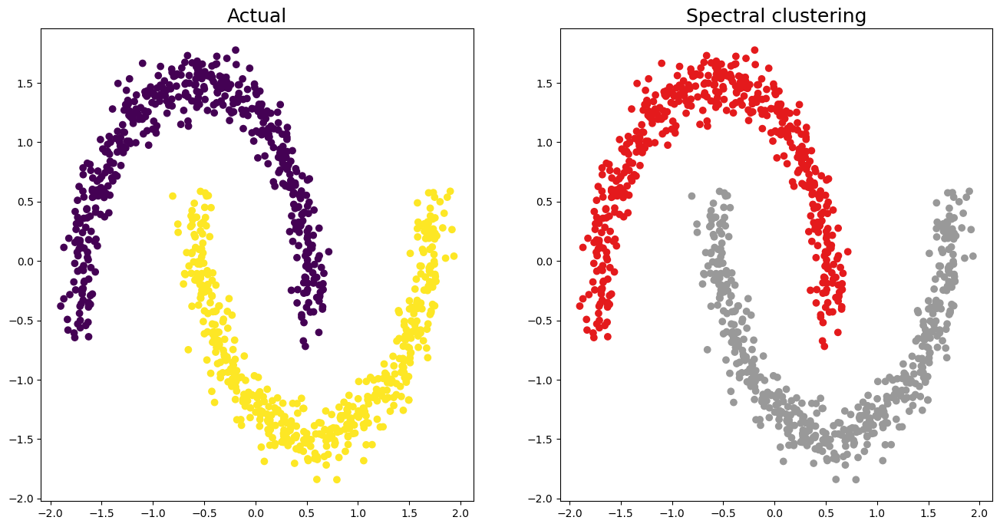

In [14]:
from sklearn.cluster import SpectralClustering

spectral_model = SpectralClustering(n_clusters = 2, affinity='nearest_neighbors', random_state=123)
labels = spectral_model.fit_predict(X_scaled)
fig, axes = plt.subplots(1, 2, figsize=(16,8))
axes[0].scatter(X_scaled[:,0], X_scaled[:,1], c=y)
axes[1].scatter(X_scaled[:,0], X_scaled[:,1], c=labels, cmap=plt.cm.Set1)
axes[0].set_title('Actual', fontsize=18)
axes[1].set_title('Spectral clustering', fontsize=18)

In [15]:
X, y = X_circles, y_circles
X_scaled = scale(X)

<div class="alert alert-block alert-info">
<strong>Implementación:</strong> cálculo y visualización de la regla del codo en el dataset Circles.
</div>

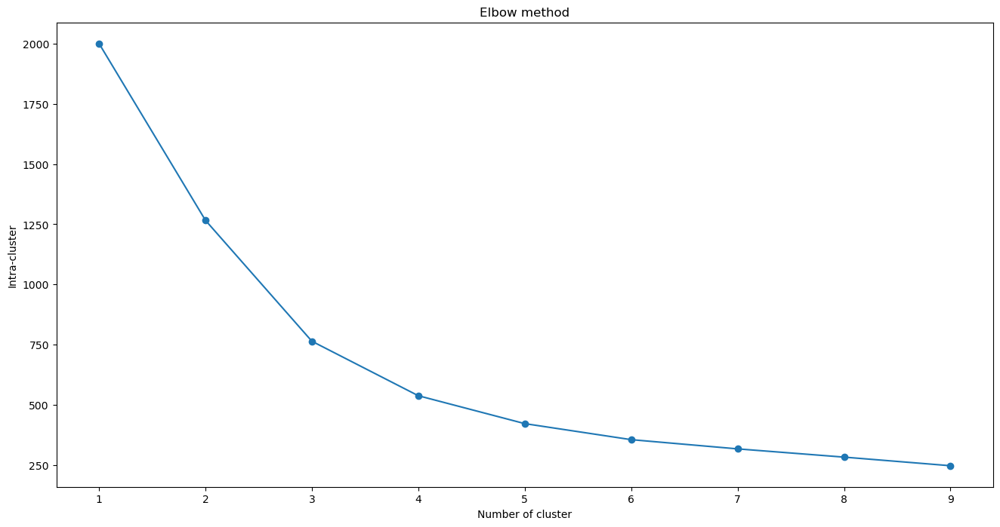

In [16]:
elbow_method(X_scaled)

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> ¿Qué se interpreta en la gráfica? ¿Cómo podría mejorarse la elección de $k$?.  
</div>

Al igual que en el caso anterior, la inspección del gráfico no proporciona una conclusión definitiva sobre el valor óptimo de $k$ utilizando la regla del codo. Por lo tanto, una vez más, recurriremos a métodos adicionales como el método de la silueta para determinar un valor de $k$:

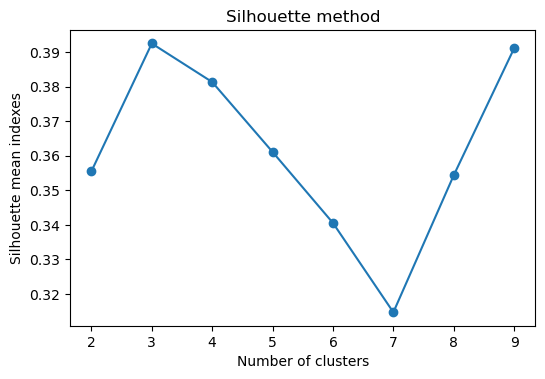

In [17]:
silhouette_plot(X_scaled)

Como podemos observar en el gráfico anterior, el valor de la siluerta se maximiza con $k=3$, que no coincide con el número verdadero de grupos que debemos identificar. Veamos que ocurre con el método del Gap Statistics.

In [18]:
from scipy.spatial.distance import cdist

# Función para calcular los saltos estádisticos
def gap_statistics(data, k_max, num_sim=10):
    """
    Estima el número óptimo de clusters en un conjunto de datos utilizando el método de Gap Statistics.

    Parámetros:
    -----------
    data : array, shape (n_samples, n_features)
        El conjunto de datos de entrada.
    k_max : int
        El número máximo de clusters a considerar.
    num_sim : int, default=10
        El número de simulaciones aleatorias a utilizar para la distribución de referencia.

    Retorna:
    --------
    k_opt : int
        El número óptimo de clusters para el cojunto de datos
    gap : array, shape (k_max,)
        La estadística de Gap para cada número de clusters k.
    """

    # Calcula los rangos de los datos
    ranges = np.apply_along_axis(lambda x: x.max() - x.min(), axis=0, arr=data)

    # Inicializa las matrices para la función de error W_k
    w_k = np.zeros(k_max)
    w_k_star = np.zeros((k_max, num_sim))

    # Calcula la función de error W_k y W_k_star para cada valor de k
    for k in range(1, k_max + 1):
        # Ejecuta el algoritmo de K-means para k clusters
        kmeans = cluster.KMeans(n_clusters=k, n_init = 10, random_state = 123).fit(data)
        # Calcula la función de error W_k para los datos de entrada
        w_k[k - 1] = np.sum(np.min(cdist(data, kmeans.cluster_centers_, 'euclidean'), axis=1)) / data.shape[0]
        # Genera num_sim muestras aleatorias de los datos y calcula la función de error W_k_star para cada muestra
        for sim in range(num_sim):
            random_data = np.random.random_sample(size=data.shape) * ranges + np.min(data, axis=0)
            kmeans = cluster.KMeans(n_clusters=k, n_init = 10, random_state = 123).fit(random_data)
            w_k_star[k - 1, sim] = np.sum(np.min(cdist(random_data, kmeans.cluster_centers_, 'euclidean'), axis=1)) / random_data.shape[0]

    # Calcula la estadística de Gap para cada valor de k
    gap = np.log(w_k_star.mean(axis=1)) - np.log(w_k)

    # Encuentra el número óptimo de clusters k
    k_opt = np.argmax(gap) + 1

    # Regresa la estadística de Gap
    return k_opt, gap

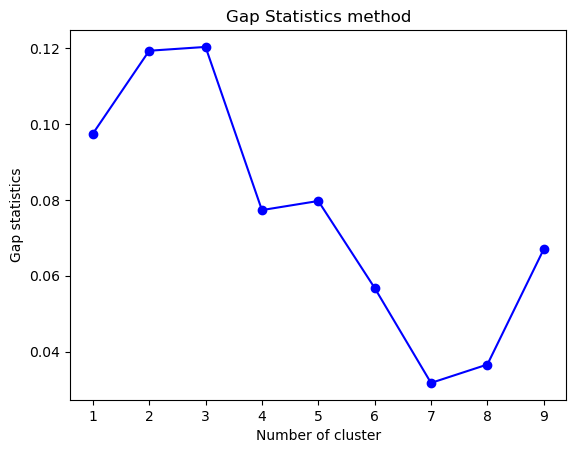

In [19]:
# Gráfico del salto estadístico
k, gap = gap_statistics(X_scaled, k_max=9, num_sim=10)

plt.plot(range(1, 10), gap, 'bo-')
plt.xlabel('Number of cluster')
plt.ylabel('Gap statistics')
plt.title('Gap Statistics method')
plt.show()

Como podemos observar en el gráfico anterior, el salto estadístico se maximiza con 2 clusters, que en este caso sí coincide con el número verdadero de grupos a encontrar. Apliquemos el algoritmo K-means con $k=2$:

<div class="alert alert-block alert-info">
<strong>Implementación:</strong> cálculo y visualización de los grupos en el dataset Circles.
</div>

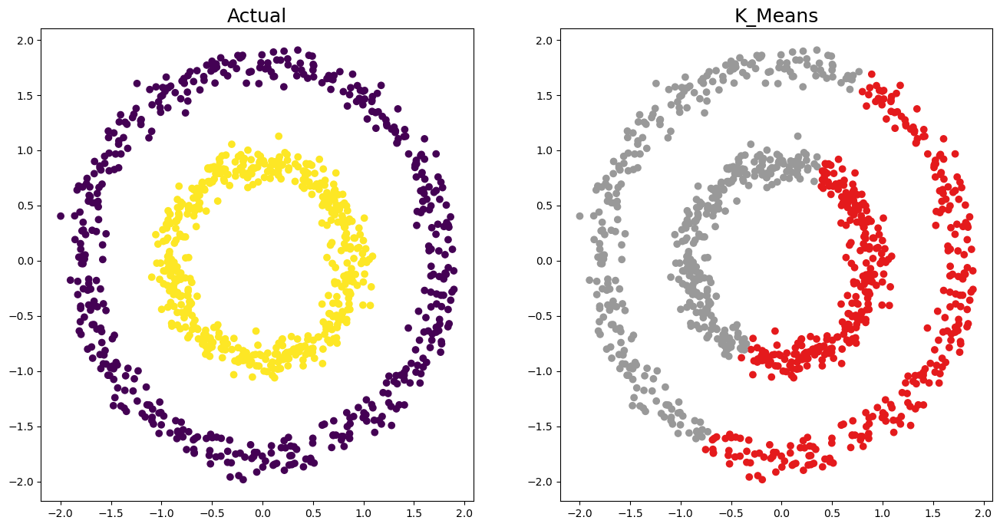

In [20]:
k_means(X_scaled, 2)

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> ¿Qué ha sucedido? Explica los motivos por los que crees que se ha producido ese resultado.  
</div>

En este tercer escenario, volvemos a notar un rendimiento insatisfactorio del algoritmo. Esto se debe una vez más a que K-means no es un método adecuado cuando las agrupaciones no siguen límites convexos.

### 1 b. Algoritmos basados en densidad: DBSCAN

En este apartado se pide aplicar clustering por densidad como [DBSCAN](https://en.wikipedia.org/wiki/DBSCAN) a los datasets anteriores para detectar los dos grupos subyacentes.

Ésta es una visualización intuitiva de su funcionamiento: https://www.youtube.com/watch?v=RDZUdRSDOok

In [21]:
X, y = X_blobs, y_blobs
X_scaled = scale(X)

<div class="alert alert-block alert-info">
<strong>Implementación:</strong> prueba la implementación de <a href="http://scikit-learn.org/stable/modules/generated/sklearn.cluster.DBSCAN.html">DBSCAN en scikit-learn</a> jugando con los parámetros <i>eps</i> y <i>min_samples</i> para encontrar los grupos (y <i>outliers</i>) del dataset Blobs.
</div>

In [22]:
from sklearn.cluster import DBSCAN

def dbscan_impl(X, eps_values, min_samples_values):
    """
    Realiza una serie de visualizaciones con el algoritmo DBSCAN utilizando diferentes valores de los
    parámetros eps y min_samples.

    Parámetros:
    -----------
    X : El conjunto de datos de entrada.
    eps_values :  Una lista de valores que representan diferentes distancias máximas
        para que dos puntos se consideren parte del mismo cluster.
    min_samples_values : Una lista de valores que representan el número mínimo de puntos
        necesarios para formar un cluster.
    """
    fig, axes = plt.subplots(len(eps_values), len(min_samples_values), figsize=(12, 12))

    for i, eps in enumerate(eps_values):
        for j, min_samples in enumerate(min_samples_values):
            dbscan = DBSCAN(eps=eps, min_samples=min_samples)
            dbscan.fit(X)
            labels = dbscan.labels_
        
            # Visualizar los resultados
            axes[i, j].scatter(X[:, 0], X[:, 1], c=labels, cmap='viridis')
            axes[i, j].set_title(f"eps={eps}, min_samples={min_samples}")
            axes[i, j].axis('off')

    plt.show()
    

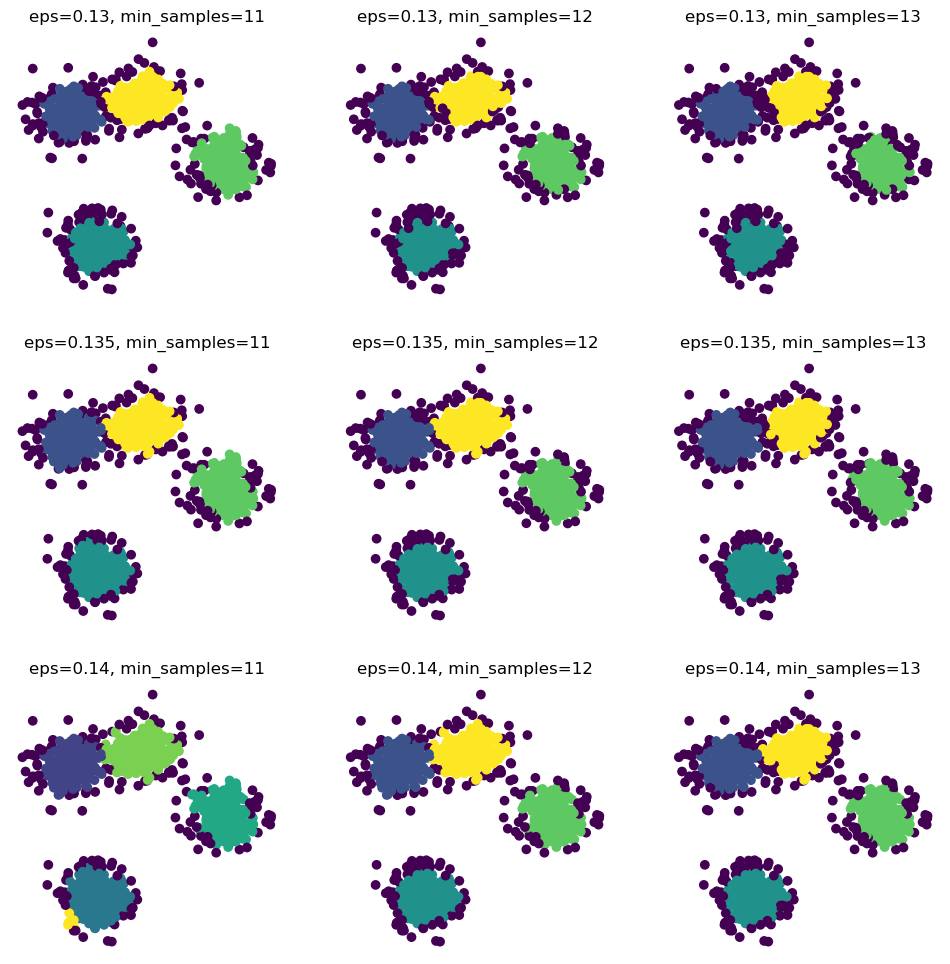

In [23]:
# Aplicar DBSCAN con diferentes valores de eps y min_samples

eps_values = [0.13,0.135, 0.14]
min_samples_values = [11, 12, 13]

dbscan_impl(X_scaled, eps_values, min_samples_values)

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> ¿Qué ha sucedido? Explica los motivos por los que crees que se ha producido ese resultado.  
</div>

Observamos un buen rendimiento del algortimo en general para las configuraciones de parámetros seleccionadas. A excepción del caso eps = 0.14 y min_samples = 11, con todas las demás, se han identificado correctamente los 4 clusters buscados. No obstante, cabe destacar que, para todas las combinaciones de parámetros, el algoritmo identifica algunos puntos como *outliers* (concretamente, aquellos que se encuentran en las fronteras de los grupos reales), cuando en realidad deberían haber sido asignados a clústeres. En resumen, en este caso particular, donde los grupos presentan formas convexas y tamaños uniformes, el algoritmo K-means demostró ser una elección más efectiva.

In [24]:
X, y = X_moons, y_moons
X_scaled = scale(X)

<div class="alert alert-block alert-info">
<strong>Implementación:</strong> prueba la implementación de DBSCAN jugando con los parámetros <i>eps</i> y <i>min_samples</i> para encontrar los grupos (y <i>outliers</i>) del dataset Moons.
</div>

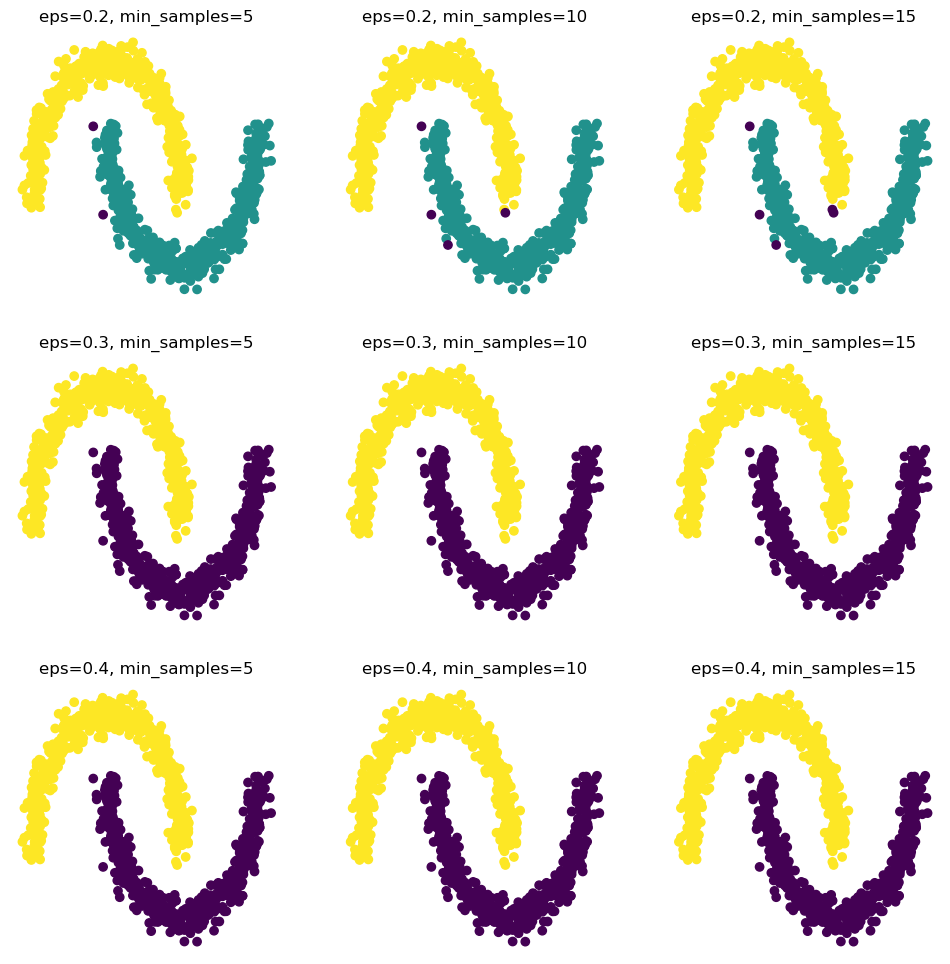

In [25]:
eps_values = [0.2, 0.3, 0.4]
min_samples_values = [5, 10, 15]

dbscan_impl(X_scaled, eps_values, min_samples_values)

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> ¿Qué ha sucedido? Explica los motivos por los que crees que se ha producido ese resultado.  
</div>

Observamos, en general, un buen rendimiento del algoritmo, claramente superior al que tuvo K-means con el mismo conjunto de datos. A excepción del resultado obtenido con las configuraciones en las que eps toma el valor 0.2, en las que algunos puntos son clasificados erróneamente como outliers, observamos la formación de dos clusters que coinciden con los grupos reales que buscábamos identificar. La razón detrás de este comportamiento es la capacidad inherente de DBSCAN para detectar clusters de forma más flexible y robusta en comparación con K-means. Mientras que K-means asume que los clusters son de forma esférica y de tamaño igual, DBSCAN puede identificar clusters de diversas formas y tamaños, lo que lo hace especialmente efectivo en conjuntos de datos con estructuras no lineales.

In [26]:
X, y = X_circles, y_circles
X_scaled = scale(X)

<div class="alert alert-block alert-info">
<strong>Implementación:</strong> prueba la implementación de DBScan jugando con los parámetros <i>eps</i> y <i>min_samples</i> para encontrar los grupos (y <i>outliers</i>) del dataset Circles.
</div>

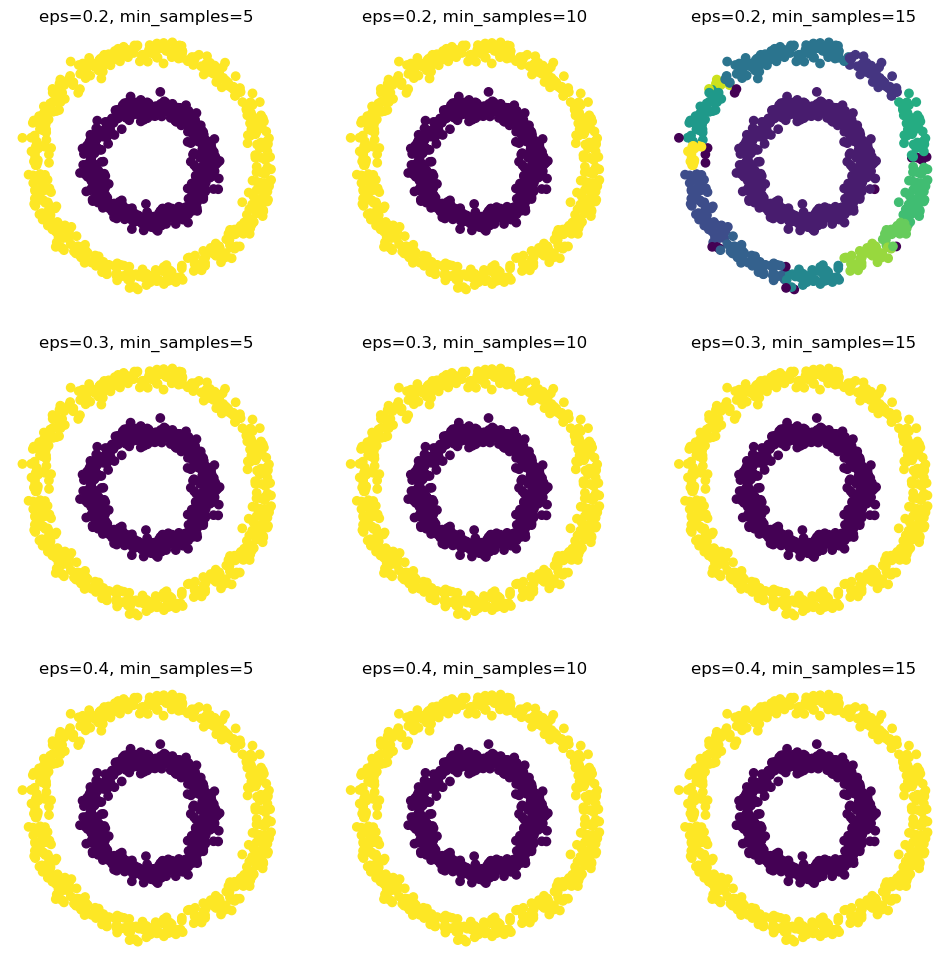

In [27]:
eps_values = [0.2, 0.3, 0.4]
min_samples_values = [5, 10, 15]

dbscan_impl(X_scaled, eps_values, min_samples_values)

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> ¿Qué ha sucedido? Explica los motivos por los que crees que se ha producido ese resultado.  
</div>

Una vez más, podemos apreciar un buen rendimiento del algoritmo DBSCAN  con este conjunto de datos. A excepción de la configuración de parámetros con eps = 0.2 y min_samples = 15, se logra con éxito la identificación de los dos clusters que corresponden a los grupos que buscábamos localizar en este caso. La razón detrás de este comportamiento es consistente con la explicación previamente mencionada.

### 1 c. Algoritmos jerárquicos

En este apartado se pide visualizar mediante un [dendrograma](https://en.wikipedia.org/wiki/Dendrogram) la construcción progresiva de los grupos mediante un algoritmo jerárquico aglomerativo (estrategia *bottom-up*). Con ello se pretende encontrar un método gráfico para entender el comportamiento del algoritmo y encontrar los *clusters* deseados en cada dataset.

In [28]:
X, y = X_blobs, y_blobs
X_scaled = scale(X)

In [29]:
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from sklearn.datasets import make_blobs
from sklearn.cluster import AgglomerativeClustering

def dendrogram_plot(X):
    """
    Realiza el clustering jerárquico en el conjunto de datos X utilizando diferentes
    métodos de enlace y visualiza los dendrogramas resultantes.

    Parámetros:
    -----------
    X : El conjunto de datos de entrada.
    """  
    # Distintos criterios de enlace
    linkage_methods = ['ward', 'complete', 'average']

    fig, axes = plt.subplots(3, 1, figsize=(8, 18)) 
    plt.subplots_adjust(hspace=0.5)

    for i, linkage_method in enumerate(linkage_methods):
        Z = linkage(X, method=linkage_method, metric='euclidean')
    
        # Crear un nuevo dendrograma
        plt.subplot(3, 1, i+1)
        plt.title(f'Linkage Method: {linkage_method}')
        plt.xlabel('sample index')
        plt.ylabel('distance')
    
        dendrogram(
            Z,
            truncate_mode='lastp',  # mostrar solo los últimos p clústeres fusionados
            show_leaf_counts=False,  # para evitar números en paréntesis
            leaf_rotation=90.,
            leaf_font_size=12.,
            show_contracted=False  # para obtener una impresión de la distribución en las ramas truncadas
        )

    plt.show()

<div class="alert alert-block alert-info">
<strong>Implementación:</strong> prueba la implementación de <a href="https://docs.scipy.org/doc/scipy/reference/cluster.hierarchy.html">clustering jerárquico de scipy</a> probando distintos <a href="https://en.wikipedia.org/wiki/Hierarchical_clustering#Linkage_criteria">criterios de enlace o <i>linkage</i></a> permitiendo identificar los clusters subyacentes (mostrando su resultado) y su dendrograma para el dataset Blobs.<br>
Puedes importar las librerías necesarias para ello.
</div>

A continuación, comparamos los resultados de aplicar un algortimo jerárquico algomerativo con los *linkages* *complete*, *ward* y *average*, utilizando la distancia euclídea como métrica de similitud.

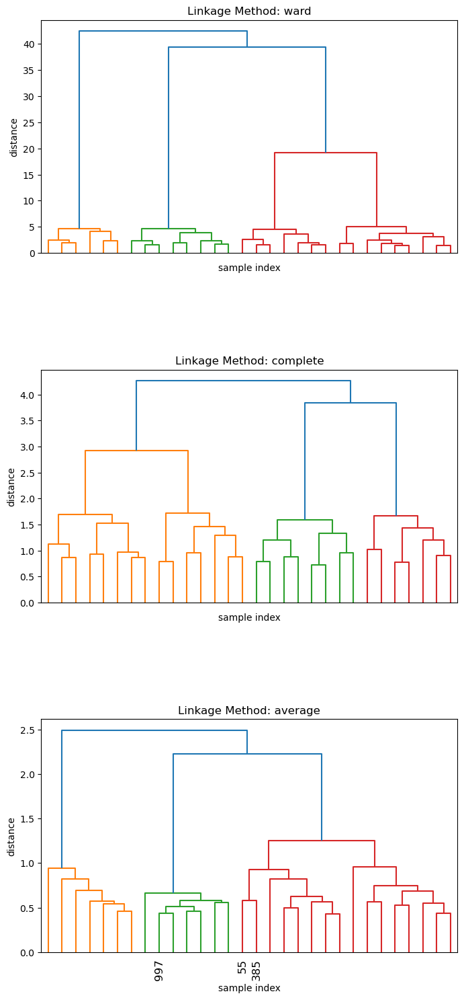

In [30]:
dendrogram_plot(X_scaled)

Después de analizar los dendrogramas anteriores, observamos que los tres tipos de linkage identifican claramente 4 clusters. Aplicamos el algoritmo para cada uno de los criterios de enlace considerados y la métrica euclideana.

In [31]:
def hierarchical_algorithm(X, clusters_number):
    """
    Realiza el clustering jerárquico en el conjunto de datos X utilizando diferentes
    métodos de enlace y compara visualmente los resultados del clustering con las
    agrupaciones reales en gráficos de dispersión.

    Parámetros:
    -----------
    X : El conjunto de datos de entrada.
    """
    # Distintos criterios de enlace
    linkage_methods = ['ward', 'complete', 'average']
    fig, axes = plt.subplots(3, 2, figsize=(12, 18))
    plt.subplots_adjust(wspace=0.5)  

    for i, linkage_method in enumerate(linkage_methods):
        cluster = AgglomerativeClustering(n_clusters=clusters_number, metric='euclidean', linkage=linkage_method)
        cluster.fit_predict(X)
    
        # Crear un nuevo gráfico de dispersión para el clustering 
        row = i  
        col = 0  
        ax = axes[row, col]
        ax.set_title(f'Linkage Method: {linkage_method}')
        ax.scatter(X[:, 0], X[:, 1], c=cluster.labels_, cmap='rainbow')
    
        # Scatter de las agrupaciones reales a la derecha 
        col = 1  
        ax_right = axes[row, col]
        ax_right.set_title('Actual')
        ax_right.scatter(X[:, 0], X[:, 1], c=y, cmap='rainbow')

    plt.show()

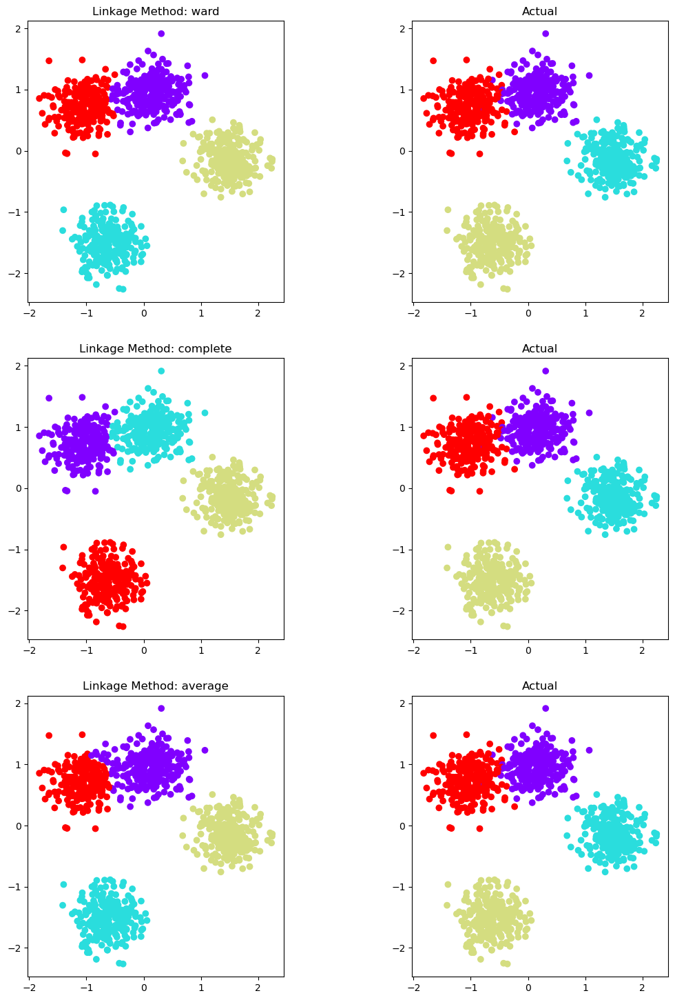

In [32]:
hierarchical_algorithm(X_scaled, 4)

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> Interpreta el dendrograma y comenta qué criterio de enlace se ha comportado mejor. ¿Por qué?
</div>

Analizando las representaciones anteriores, observamos que en cualquiera de los tres casos se obtienen resultados satisfactorios. Sin embargo, podemos observar que en el caso del tipo de *linkage* *average*, se entremezclan erróneamente más puntos pertenecientes a los clusters situados en la parte superior del gráfico. En contraste, con los otros dos criterios de enlace considerados, se obtiene una clasificación más precisa.

In [33]:
X, y = X_moons, y_moons
X_scaled = scale(X)

<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
prueba la implementación de <a href="https://docs.scipy.org/doc/scipy/reference/cluster.hierarchy.html">clustering jerárquico de scipy</a> probando distintos <a href="https://en.wikipedia.org/wiki/Hierarchical_clustering#Linkage_criteria">criterios de enlace o <i>linkage</i></a> permitiendo identificar los clusters subyacentes (mostrando su resultado) y su dendrograma para el dataset Moons.<br>
Puedes importar las librerías necesarias para ello.
</div>

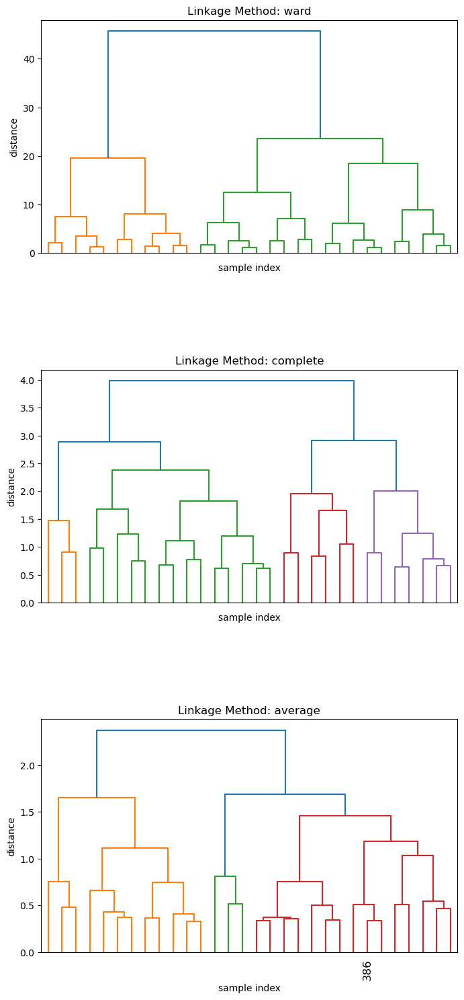

In [34]:
dendrogram_plot(X_scaled)

En este caso, los tres tipos de *linkage* no logran identificar un número fijo de clusters. Por ejemplo, observamos cómo el linkage "ward" identifica dos clusters, mientras que "complete" y "average" identifican 5 clusters. Dado que conocemos de antemano el número de agrupaciones que debemos encontrar, aplicaremos el algoritmo considerando 2 clusters.

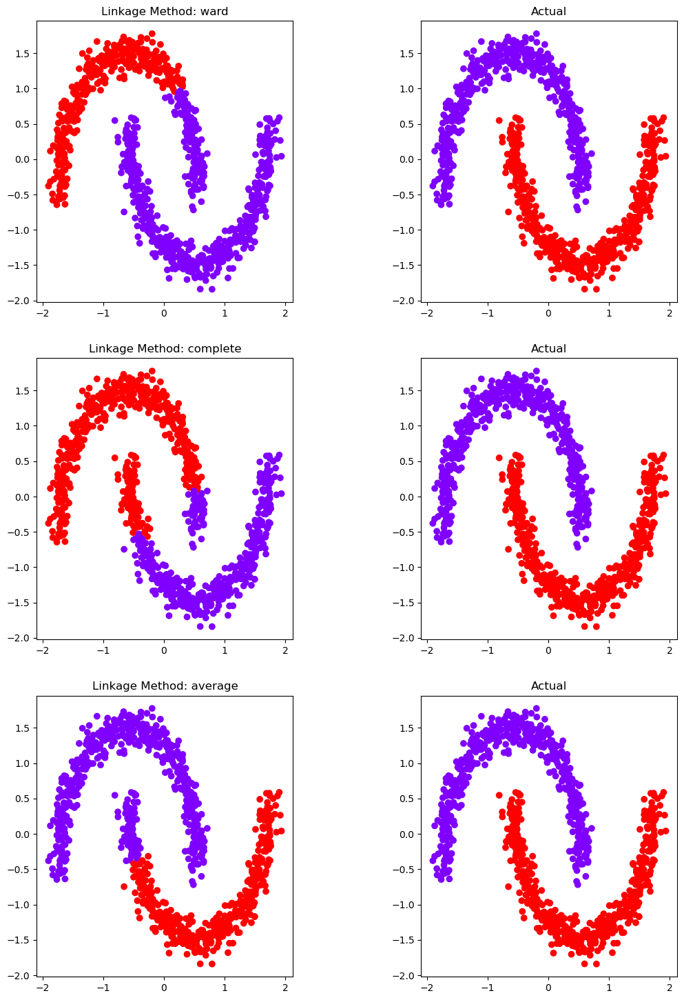

In [35]:
hierarchical_algorithm(X_scaled, 2)

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> Interpreta el dendrograma y comenta qué criterio de enlace se ha comportado mejor. ¿Por qué?
</div>

Observamos que con ninguno de los tres criterios de enlace se obtienen las dos agrupaciones que estábamos buscando. No obstante, podríamos decir que el algoritmo se comporta mejor con el *linkage* *average*, puesto que logra identificar completamente al menos uno de los clusters, similar a lo que ocurre con el *linkage* *ward* (no siendo así con el *linkage* *complete*), pero éste es capaz de clasificar más puntos correctamente del otro grupo.

In [36]:
X, y = X_circles, y_circles
X_scaled = scale(X)

<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
prueba la implementación de <a href="https://docs.scipy.org/doc/scipy/reference/cluster.hierarchy.html">clustering jerárquico de scipy</a> probando distintos <a href="https://en.wikipedia.org/wiki/Hierarchical_clustering#Linkage_criteria">criterios de enlace o <i>linkage</i></a> permitiendo identificar los clusters subyacentes (mostrando su resultado) y su dendrograma para el dataset Circles.<br>
Puedes importar las librerías necesarias para ello.
</div>

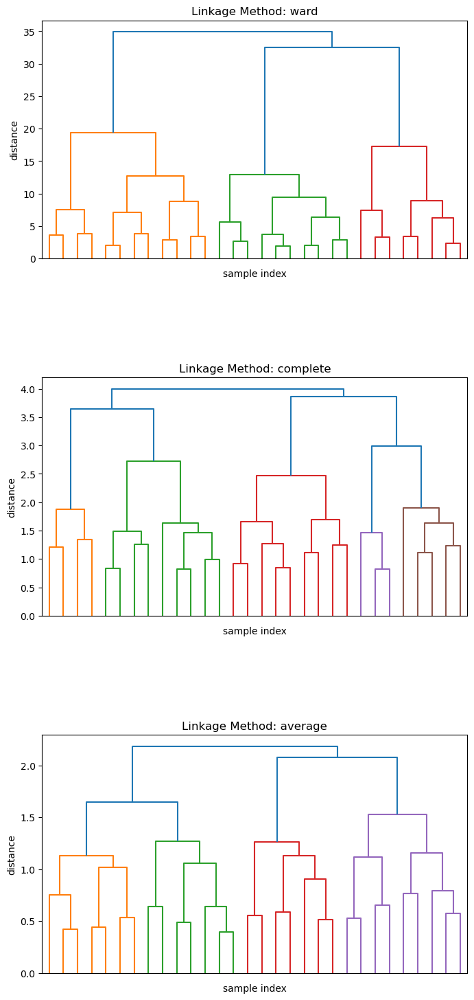

In [37]:
dendrogram_plot(X_scaled)

Después de analizar los dendrogramas anteriores, identificamos 3 clusters para el tipo de linkage "ward" y 4 clusters para los otros dos criterios. Dado que, una vez más, conocemos de antemano el número de agrupaciones que debemos encontrar, aplicaremos el algoritmo considerando 2 clusters.

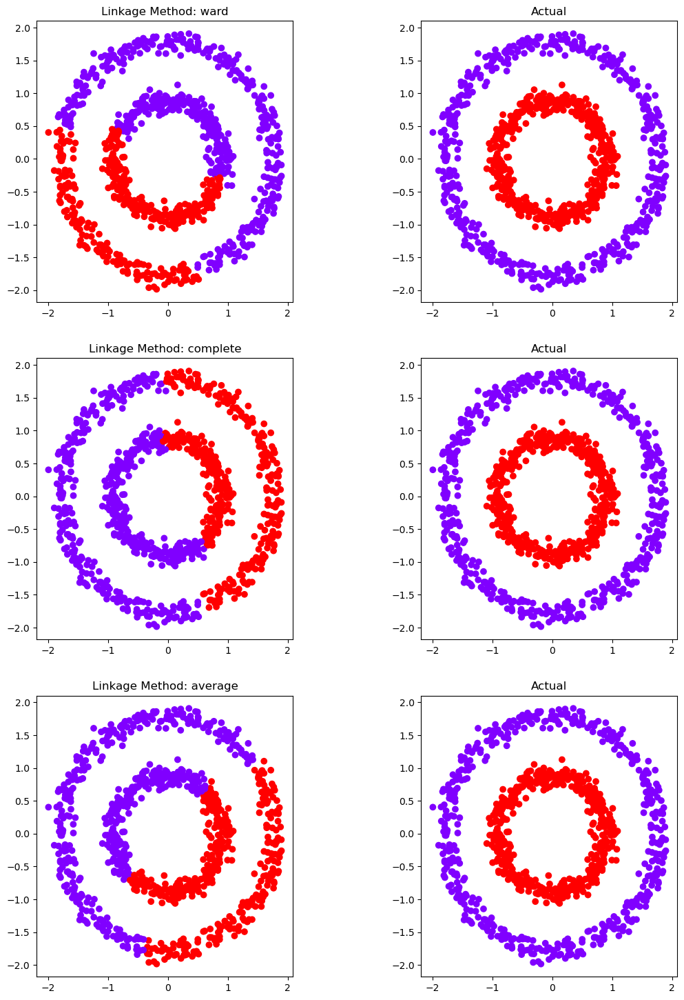

In [38]:
hierarchical_algorithm(X_scaled, 2)

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> Interpreta el dendrograma y comenta qué criterio de enlace se ha comportado mejor. ¿Por qué?
</div>

El resultado obtenido con el algoritmo es, de nuevo, insatisfactorio. Ninguno de los tres criterios de enlace logra identificar los grupos deseados, y no parece que el rendimiento sea significativamente mejor con alguno de los criterios en comparación con los otros.

<a id="ej2"></a>

## 2. Ejemplo práctico con aperturas de ajedrez: reducción de dimensionalidad (6 puntos)

En ajedrez existen multitud de aperturas y variantes. Te permiten planificar como posicionarás tus piezas, lo cual puede otorgar una gran ventaja durante el desarrollo de la partida. Hay tantas aperturas distintas (cada una de ellas con sus variantes) que puede ser dificil situarte, como puede apreciarse en el siguiente video del Maestro FIDE [Luis Fernández](https://www.youtube.com/watch?v=soeEeadcOKw).

Como muchas aperturas se parecen a otras, porque tienen planes similares, una buena forma para ubicarse es saber cuales se parecen entre sí. Y esa es la idea de este análisis.

Partiremos de un [dataset de partidas de ajedrez](https://www.kaggle.com/datasets/datasnaek/chess) en la plataforma [lichess](https://lichess.org/), que consta de los siguientes campos (se resaltan los útiles para el análisis):

   - Game ID
   - Rated (T/F)
   - Start Time
   - End Time
   - **Number of Turns**
   - Game Status
   - Winner
   - Time Increment
   - White Player ID
   - White Player Rating
   - Black Player ID
   - Black Player Rating
   - **All Moves in Standard Chess Notation**
   - Opening Eco (código estandar de aperturas)
   - **Opening Name**
   - **Opening Ply** (número de movimientos de la apertura de la partida)

Se carga el dataset en un dataframe de pandas:

In [39]:
df = pd.read_csv('games.csv')
df.head()

,id,rated,created_at,last_move_at,turns,victory_status,winner,increment_code,white_id,white_rating,black_id,black_rating,moves,opening_eco,opening_name,opening_ply
0,TZJHLljE,False,1.504210e+12,1.504210e+12,13,outoftime,white,15+2,bourgris,1500,a-00,1191,d4 d5 c4 c6 cxd5 e6 dxe6 fxe6 Nf3 Bb4+ Nc3 Ba5...,D10,Slav Defense: Exchange Variation,5
1,l1NXvwaE,True,1.504130e+12,1.504130e+12,16,resign,black,5+10,a-00,1322,skinnerua,1261,d4 Nc6 e4 e5 f4 f6 dxe5 fxe5 fxe5 Nxe5 Qd4 Nc6...,B00,Nimzowitsch Defense: Kennedy Variation,4
2,mIICvQHh,True,1.504130e+12,1.504130e+12,61,mate,white,5+10,ischia,1496,a-00,1500,e4 e5 d3 d6 Be3 c6 Be2 b5 Nd2 a5 a4 c5 axb5 Nc...,C20,King's Pawn Game: Leonardis Variation,3
3,kWKvrqYL,True,1.504110e+12,1.504110e+12,61,mate,white,20+0,daniamurashov,1439,adivanov2009,1454,d4 d5 Nf3 Bf5 Nc3 Nf6 Bf4 Ng4 e3 Nc6 Be2 Qd7 O...,D02,Queen's Pawn Game: Zukertort Variation,3
4,9tXo1AUZ,True,1.504030e+12,1.504030e+12,95,mate,white,30+3,nik221107,1523,adivanov2009,1469,e4 e5 Nf3 d6 d4 Nc6 d5 Nb4 a3 Na6 Nc3 Be7 b4 N...,C41,Philidor Defense,5


### 2 a. Preparación del dato

El primer paso al tratar con dato real es analizar el dato para comprender el dominio, y aplicar determinados filtrados en base a la lógica de tu tarea.

<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
filtra (quédate) las partidas que tienen aperturas de 4 o más movimientos (campo opening_ply).
</div>

In [40]:
# Filtrar las partidas con aperturas de 4 o más movimientos
df = df[df['opening_ply'] >= 4]

<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
filtra (quédate) las partidas que tienen al menos el doble de movimientos (campo "turns") que los de la apertura (campo opening_ply).
</div>

In [41]:
# Filtrar las partidas que tienen al menos el doble de movimientos que los de la apertura
df = df[df['turns'] >= 2 * df['opening_ply']]

<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
si el nombre de la apertura (campo opening_name) contiene el caracter "|" ignora todo el texto que le sigue.
</div>

In [42]:
# Dividir el campo "opening_name" en "|" y seleccionar la primera parte
df['opening_name'] = df['opening_name'].str.split('|').str[0]

<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
filtra (quédate) sólo las aperturas (por su nombre, campo opening_name) que hayan sido usadas en al menos 40 partidas. Para tener un mínimo de muestras de ese tipo, eliminando muchas aperturas apenas usadas.
</div>

In [43]:
# Contar cuántas veces se usa cada apertura
aperturas_usadas = df['opening_name'].value_counts()

# Filtrar las aperturas que se han utilizado al menos 40 veces
aperturas_frecuentes = aperturas_usadas[aperturas_usadas >= 40].index

# Filtrar el DataFrame original para incluir solo las aperturas frecuentes
df = df[df['opening_name'].isin(aperturas_frecuentes)]

**AVISO: ¡no es necesario saber interpretar correctamente la notación algebraica para el desarrollo de la práctica!**

Los movimientos en ajedrez se pueden transcribir de distintas maneras, la más popular es la [notación algebraica](https://es.wikipedia.org/wiki/Notaci%C3%B3n_algebraica). En este caso, la notación algebraica empleada es la inglesa.

En concreto, el campo **moves** tiene los movimientos alternos tanto de las blancas como de las negras. Por tanto, la secuencia:

```e4 c5 Nf3 Qa5...```

Se interpretaría como:

 - Las blancas mueven el peón de rey a la casilla e4.
 - Las negras responden con el peón a c5.
 - Las blancas mueven el caballo (N) a la casilla f3.
 - Las negras mueven su dama a la casilla a5.
 
Y así alternan movimientos hasta el final de la partida (victoria, tablas, abandono o quedarse sin tiempo).

Es importante tener en cuenta que el campo **moves** es de tipo *string*, por lo que será necesario dividirlo por el separador (espacio) para tener cada movimiento por separado. Útil para los siguientes pasos.

<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
crea una columna llamada "white_moves" que contenga una lista con sólo los movimientos de la apertura del participante blanco (los impares del campo moves y tantos como indique opening_ply).
</div>

In [44]:
# Dividir el campo "moves" por espacios y seleccionar los movimientos pares (movimientos del participante blanco)
df['white_moves'] = df['moves'].str.split().str[::2]

# Filtrar los movimientos de apertura según el número de movimientos de la apertura (opening_ply)
df['white_moves'] = df['white_moves'].apply(lambda x: x[:df['opening_ply'].iloc[0]])

Para comparar las aperturas entre sí usaremos los movimientos empleados en ella sólo por parte del jugador blanco (sólo hay nombre de la apertura del jugador blanco). Por simplicidad, podemos ignorar su orden, por lo que podemos usar la estrategia de [bag of words](https://es.wikipedia.org/wiki/Modelo_bolsa_de_palabras). Generando, a partir del campo **white_moves** un nuevo dataset con tantas dimensiones como posibles movimientos con un 1 si se ha realizado durante la apertura y un 0 si no se ha realizado.

Puedes crear nuevas columnas a partir de valores con el método [get_dummies()](https://pandas.pydata.org/docs/reference/api/pandas.get_dummies.html) de pandas.

Si el campo a partir del cual quieres generar las dimensiones es una lista de strings, [aquí](https://stackoverflow.com/questions/47786822/how-do-you-one-hot-encode-columns-with-a-list-of-strings-as-values) hay una pista.

<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
crea un nuevo dataframe usando el modelo bag of words a partir del campo white_moves. Puedes usar para ello el método get_dummies.
</div>

In [45]:
from sklearn.preprocessing import MultiLabelBinarizer

mlb = MultiLabelBinarizer()

df_new = pd.DataFrame(mlb.fit_transform(df['white_moves']),columns=mlb.classes_, index=df.index)

### 2 b. Reducción de dimensionalidad

En este punto tienes un dataset con tantas filas como partidas y tantas columnas como movimientos posibles efectuados en el conjunto de datos.

El problema es que ahora dispones de muchas dimensiones, por lo que para visualizar los datos y comprobar si hay algún tipo de estructura es necesario reducir su dimensionalidad. Obteniendo un *embedding* (representación compacta) de las aperturas.

La reducción de dimensionalidad puede llevarse a cabo con métodos como PCA. Pero este método tiene la limitación de que sólo realiza proyecciones lineales. Por lo que otros métodos como [t-SNE](https://www.youtube.com/watch?v=NEaUSP4YerM) o [UMAP](https://www.youtube.com/watch?v=jth4kEvJ3P8) pueden ofrecer mejores resultados.

<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
reduce la dimensionalidad de los datos mediante UMAP a dos dimensiones para poder visualizarlo posteriormente.
</div>

In [46]:
umap_data = umap.UMAP(n_components=2, random_state = 123, n_jobs = 1).fit_transform(df_new)

<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
visualiza la reducción de dimensionalidad mediante un scatter plot de la librería <strong>matplotlib</strong> donde cada punto es una muestra con coordenadas obtenidas tras la reducción de dimensionalidad para poder observar las estructuras que han emergido en el nuevo espacio.
</div>

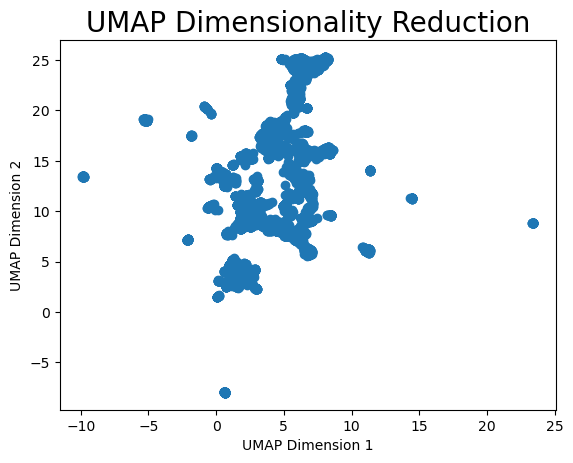

In [47]:
plt.scatter(umap_data[:, 0], umap_data[:, 1])
plt.title('UMAP Dimensionality Reduction', fontsize=20)
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.show()

<div class="alert alert-block alert-info">
<strong>Implementación opcional:</strong>
visualiza la reducción de dimensionalidad mediante un scatter plot de la librería <strong>plotly</strong>, al igual que antes, donde cada punto es una muestra con coordenadas obtenidas tras la reducción de dimensionalidad. De tal manera que al situarnos encima de cada muestra con el ratón (hovertext) nos indique el nombre de la apertura usada, para poder explorar mejor los datos.
</div>

In [48]:
import plotly.express as px
import plotly.graph_objects as go


umap_df = pd.DataFrame(umap_data, columns=['UMAP Dimension 1', 'UMAP Dimension 2'])

umap_df['Opening Name'] = df['opening_name'].values


fig = px.scatter(umap_df, x="UMAP Dimension 1", y="UMAP Dimension 2",hover_name='Opening Name')

fig.show()

### 2 c. Clustering

Tras observar la estructura de las muestras en baja dimensionalidad.

<div class="alert alert-block alert-info">
<strong>Análisis:</strong>
¿Qué método de clustering sería adecuado para detectar los distintos grupos? ¿Por qué?
</div>

Analizando gráfico anterior, observamos que la estructura de los datos no revela de manera evidente un número claro de clusters que debamos encontrar. Además, los grupos que se aprecian parecen no tener formas convexas y presentan una densidad variable. También, se observa que el conjunto de datos contiene un nivel significativo de ruido. Teniendo en cuenta estos factores, el algoritmo DBSCAN se presenta como una elección apropiada para abordar este escenario. 

<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
realiza el clustering con la técnica elegida para que encuentre automáticamente los grupos.
</div>

In [49]:
get_clusters = DBSCAN(eps=2, min_samples = 5).fit_predict(umap_data)

<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
visualiza el anterior scatter plot con matplotlib (y opcionalmente con plotly) con la novedad de que el color de cada muestra se corresponda con el cluster asociado para poder observar el efecto del clustering. Utiliza una paleta de colores cualitativa (discreta) para facilitar su interpretación.
</div>

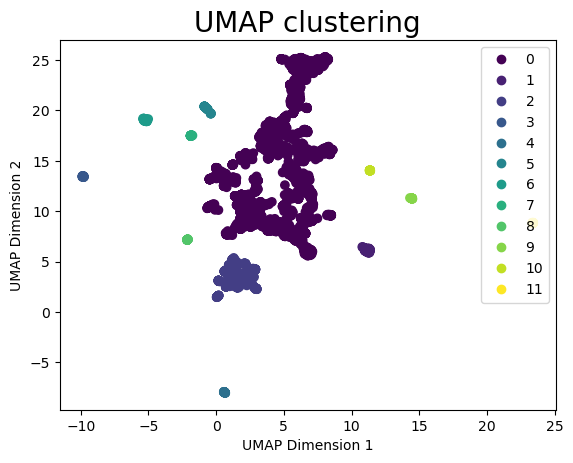

In [50]:
s = plt.scatter(umap_data[:, 0], umap_data[:, 1], c = get_clusters, cmap = 'viridis')
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.legend(s.legend_elements()[0], list(set(get_clusters)))
plt.title('UMAP clustering', fontsize=20)
plt.show()

<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
para cada cluster, visualiza un gráfico de barras donde cada barra sea una de las aperturas que aparecen en el cluster y su tamaño se corresponda con el número de muestras dentro de ese grupo que han realizado esa apertura. Como consejo, puedes usar matplotlib o incluso pandas. También puede ser útil graficar con barras horizontales en lugar de verticales para facilitar su lectura.
</div>

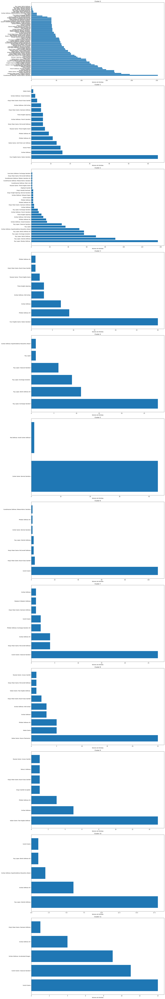

In [51]:
import pandas as pd
import matplotlib.pyplot as plt


df['Cluster'] = get_clusters

# Crea una tabla de contingencia para contar cuántas veces se realiza cada apertura en cada cluster.
contingency_table = pd.crosstab(df['opening_name'], df['Cluster'])

# Representa los resultados para cada cluster.
unique_clusters = df['Cluster'].unique()
n_clusters = len(unique_clusters)

fig, axes = plt.subplots(n_clusters, 1, figsize=(20, 10 * n_clusters))
plt.subplots_adjust(hspace=1)

# Itera a través de cada cluster y crea un gráfico de barras horizontal para las aperturas en ese cluster.
for i, cluster in enumerate(unique_clusters):
    cluster_data = contingency_table[contingency_table[cluster] >= 1][cluster].sort_values(ascending=False)
    
    axes[i].barh(cluster_data.index, cluster_data.values)
    axes[i].set_xlabel('Número de Partidas')
    axes[i].set_title(f'Cluster {cluster}')

plt.tight_layout()
plt.show()

### 2 d. Análisis

Una manera habitual de comparar variables (en este caso aperturas) es emplear una matriz de distancias. Donde podemos representar cuál es la distancia mínima, media o máxima entre dos aperturas.

Dado que cada apertura tiene distintas muestras (al menos 40). Si usamos el mínimo y tuviésemos 5 muestras de la apertura A y 3 de la B. La distancia entre las aperturas A y B sería la mínima de las 15 distancias posibles que hay entre las 5 muestras de A y las 3 de B.

<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
calcula y visualiza la distancia (euclídea en este caso) entre todas las aperturas mediante una matriz de distancias usando plotly o seaborn (mediante un heatmap). El proceso de cálculo puede llevar mucho tiempo. Se recomienda calcular la distancia entre las muestras en baja dimensionalidad usando la librería numpy empleando la normal tras la resta de las muestras. Si aún así se dilata en el tiempo puedes probar a realizar sampling aleatorio del dataset para reducir el número de muestras. Peinsa que la matriz de distancia tiene bastantes simetrías que pueden ser aprovechadas para ahorrar cálculos. Puedes utilizar tqdm para visualizar y estimar la duración del proceso de cálculo.
</div>

In [52]:
from tqdm import tqdm

import pandas as pd


sample = umap_data[np.random.choice(umap_data.shape[0], 100, replace=False)]

num_aperturas = umap_data.shape[0]
dist_matrix = np.zeros((num_aperturas, num_aperturas))

for i in tqdm(range(num_aperturas), desc="Calculating Distances", ncols=100):
    for j in range(i, num_aperturas):
        dist = np.linalg.norm(umap_data[i] - umap_data[j])
        dist_matrix[i, j] = dist
        dist_matrix[j, i] = dist

Calculating Distances: 100%|███████████████████████████████████| 6415/6415 [00:56<00:00, 113.18it/s]


In [ ]:
import seaborn as sns

# Visualiza la matriz de distancias como un heatmap
plt.figure(figsize=(10, 10))
sns.heatmap(dist_matrix, cmap="YlGnBu", xticklabels=False, yticklabels=False)
plt.title("Matriz de Distancias Euclidianas entre Aperturas")
plt.show()

<div class="alert alert-block alert-info">
<strong>Análisis:</strong>
Argumenta las conclusiones obtenidas tras interpretar las visualizaciones de los puntos anteriores: estructura de las muestras en baja dimensionalidad, clustering, gráficos de la dominancia de las aperturas contenidas en cada cluster y la matriz de distancias.
</div>

Como mencionamos anteriormente, al analizar la estructura de las muestras en baja dimensionalidad, notamos que no hay clusters perfectamente definidos y que el conjunto de datos exhibía un nivel significativo de ruido. Por su parte, en la representación del clustering realizado a través de DBSCAN, observamos la formación de 12 clusters con densidades muy variables. Específicamente, destacan dos clusters de mayor tamaño en comparación con el resto, siendo la diferencia en tamaño entre estos dos también notable. Esta disparidad se refleja en los gráficos que ilustran la predominancia de aperturas dentro de cada cluster. Los clusters más grandes contienen una mayor variedad de aperturas, mientras que en los clusters de menor tamaño, el número de aperturas distintas es limitado, conteniendo además una apertura que claramente predomina sobre las demás.

Finalmente, al examinar el gráfico de matriz de distancias, notamos que las aperturas están distribuidas de manera dispersa, sin agrupaciones claras ni patrones de similitud evidentes entre ellas, lo cual se alinea con lo que habíamos observado en las representaciones previas.

### 2 e. OPCIONAL

Para comprender mejor lo analizado, puedes visualizar las aperturas de las muestras mediante la librería **chess** que facilita mucho la tarea.

Para ello selecciona una muestra (más fácil) o un tipo de apertura, y de la columna *moves* selecciona 2 * *opening_ply* movimientos de la apertura (el x2 es para coger los de las blancas y las negras). Una vez que ya los tengas puedes crear un tablero con la librería chess:

```board = chess.Board()```

Tras ello, simplemente itera por esos primeros y pásaselos al tablero mediante el método ```push_san``` con:

```board.push_san('d4')```

hasta agotar los movimientos **SOLO de la apertura** de blancas y negras en el mismo orden en el que ya aparecen en el campo *moves*.

In [ ]:
import chess

# Selecciona una muestra de la columna 'moves'
sample_moves = df['moves'][4] 

# Divide los movimientos en una lista
moves_list = sample_moves.split()

# Obtiene el número de movimientos a considerar (2 veces el valor de opening_ply)
num_moves_to_select = 2 * df['opening_ply'][4]

# Crea un tablero de ajedrez
board = chess.Board()

# Itera por los primeros movimientos (2 * opening_ply) y los aplica al tablero
for move in moves_list[:num_moves_to_select]:
    board.push_san(move)
    print(board)
    print('\n')